In [2]:
import itertools
import numpy as np
import os
import seaborn as sns
from tqdm import tqdm
from dataclasses import asdict, dataclass, field
import vsketch
import shapely.geometry as sg
from shapely.geometry import box, MultiLineString, Point, MultiPoint, Polygon, MultiPolygon, LineString
import shapely.affinity as sa
import shapely.ops as so
import matplotlib.pyplot as plt
import pandas as pd

import vpype_cli
from typing import List, Generic
from genpen import genpen as gp, utils as utils
from scipy import stats as ss
import geopandas
from shapely.errors import TopologicalError
import functools
%load_ext autoreload
%autoreload 2
import vpype
from skimage import io
from pathlib import Path

import bezier

from sklearn.preprocessing import minmax_scale
from skimage import feature
from genpen.utils import Paper

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
from genpen.genpen import *

In [4]:
# make page
paper_size = '11x14 inches'
border:float=30
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

# start with an interesting pattern?

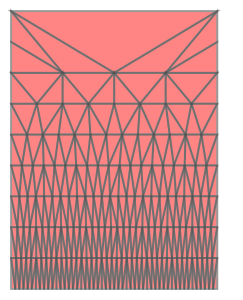

In [6]:
polys = MultiPolygon(so.triangulate(points, tolerance=0.5))
polys

## do the shading

In [8]:
class Fill(Shape):
    
    def __init__(self):
        self._p = p
        
    def _repr_svg_(self):
        return self.fill._repr_svg_()
    
    @property
    def boundary(self):
        return self._p.boundary
    
    @property
    def fill(self):
        return self.fill_poly(self._p)
    
    @property
    def _all_geoms(self):
        return sg.GeometryCollection([self.boundary, self.fill])

class Angle(object):
    
    @property
    def deg(self):
        return self._deg
    
    @deg.setter
    def deg(self, deg):
        self._deg = deg
        self._rad = np.deg2rad(deg)
    
    @property
    def rad(self):
        return self._rad
    
    @rad.setter
    def rad(self, rad):
        self._deg = np.rad2deg(rad)
        self._rad = rad
        
    
    def __init__(self, deg=None, rad=None):
        if (deg is not None) and (rad is not None):
            print('WARNING: arguments entered for both deg and rad; defaulting to using deg')
        if deg is not None:
            self.deg = deg
        elif rad is not None:
            self.rad = rad
            
            
    def __repr__(self):
        return f'deg = {self.deg} \nrad = {self.rad:.3}'

@dataclass
class Filler(DataClassBase):
        
    def fill_poly(self, poly):
        return self.fill_func(poly)
    
    
    
@dataclass  
class HatchFill(Shape):
    
    def __init__(
        self,
        poly_to_fill:sg.Polygon,
        degrees:float=0.,
        spacing:float=0.5,  # usually mm
        alternate_direction:bool=True,
        fill_inscribe_buffer=1.1,
    ):
        self._ptf = poly_to_fill
        self.degrees = degrees
        self.spacing = spacing
        self.alternate_direction = alternate_direction
        self.fill_inscribe_buffer = fill_inscribe_buffer
    
    @property
    def angle(self):
        return Angle(deg=self.degrees)
    
    @property
    def inscribe_radius(self):
        d_from_furthest_vertex_to_centroid = self._ptf.hausdorff_distance(self._ptf.centroid)
        return d_from_furthest_vertex_to_centroid * self.fill_inscribe_buffer
    
    @property
    def inscribe_diameter(self):
        return self.inscribe_radius * 2
    
    @property
    def envelope_inscribe(self):
        return self._ptf.centroid.buffer(self.inscribe_radius)
    
    @property
    def envelope(self):
        # rotating geom around centroid will always be inside this
        return Shape(box(*self.envelope_inscribe.bounds))
    
    @property
    def _e(self):
        return self.envelope
    
    @property
    def spacings(self):
        try:
            len(self.spacing) > 1
            spacings = self.spacing
        except TypeError:
            # if spacing is a number, make list of uniform spacings
            spacings = np.arange(0, self.inscribe_diameter, self.spacing)
        return spacings
    
    @property
    def lines(self):
        left = self.envelope.left
        right = self.envelope.right
        top = self.envelope.top
        lines = []
        for ii, _spacing in enumerate(spacings):
            y = top - _spacing
            line = LineString(((left, y), (right, y)))
            lines.append(line)
            
        if self.alternate_direction:
            for i in range(len(lines)):
                if i % 2:
                    lines[i] = reverse_LineString(lines[i])
        
        return sg.MultiLineString(lines)
    
    @property
    def rotated_lines(self):
        return sa.rotate(self.lines, self.angle.deg, origin=self._ptf.centroid, use_radians=False)
    
    @property
    def fill(self):
        return self._ptf.intersection(self.rotated_lines)
    
    @property
    def _p(self):
        return self.fill
        
    
    

@dataclass  
class BezierHatchFill(HatchFill):
    
    def __init__(
        self,
        poly_to_fill:sg.Polygon,
        xjitter_func,
        yjitter_func,
        degrees:float=0.,
        spacing:float=0.5,  # usually mm
        alternate_direction:bool=True,
        fill_inscribe_buffer=1.01,
        n_nodes_per_line=20,
        n_eval_points=100,
        
    ):
        self._ptf = poly_to_fill
        self.degrees = degrees
        self.spacing = spacing
        self.alternate_direction = alternate_direction
        self.fill_inscribe_buffer = fill_inscribe_buffer
        self.n_nodes_per_line = n_nodes_per_line
        self.init_nodes = None
        self.xjitter_func = make_callable(xjitter_func)
        self.yjitter_func = make_callable(yjitter_func)
        self.n_eval_points = n_eval_points
    
    def initialize_nodes(self):
        # here to be expanded
        self.init_node_xs = np.linspace(self._e.left, self._e.right, self.n_nodes_per_line)
        self.init_node_ys = np.zeros_like(self.init_node_xs)
        self.init_nodes = np.stack([self.init_node_xs, self.init_node_ys])
    
    @property
    def node_sets(self):
        if self.init_nodes is None:
            self.initialize_nodes()
        xs = self.init_node_xs.copy()
        ys = self.init_node_ys.copy()
        nodes = np.stack([xs, ys])
        node_sets = [nodes.copy()]
        for ii in range(1, len(self.spacings)):
            xs += self.xjitter_func(xs.shape)
            ys += self.yjitter_func(ys.shape)
            nodes = np.stack([xs, ys])
            node_sets.append(nodes)
        return node_sets
        
    @property
    def ft_node_sets(self):
        return [np.asfortranarray(n) for n in self.node_sets]
    
    @property
    def curves(self):
        curves = []
        for node_set in self.ft_node_sets:
            curve = bezier.Curve(node_set, degree=(node_set.shape[1]-1))
            curves.append(curve)
        return curves
    
    @property
    def _interpolated_curves(self):
        i_curves = []
        for curve in self.curves:
            eval_points = np.linspace(0, 1, self.n_eval_points)
            x, y = curve.evaluate_multi(eval_points)
            i_curves.append(np.stack([x, y]).T)
        return i_curves
    
    @property
    def lines(self):
        lines = []
        
        for ii, curve in enumerate(self._interpolated_curves):
            spacing = self.spacings[ii]
            y = self._e.top - spacing
            _curve = curve.copy()
            _curve[:, 1] += y
            line = LineString(_curve)
            lines.append(line)
            
        if self.alternate_direction:
            for i in range(len(lines)):
                if i % 2:
                    lines[i] = reverse_LineString(lines[i])
        
        lines = [l for l in lines if l.length > 0]
        
        return sg.MultiLineString(lines)
    
    

In [9]:
bhf = BezierHatchFill(
    spacing=1.,
    poly_to_fill=poly_to_fill, 
    xjitter_func=xjitter_func, 
    yjitter_func=yjitter_func)

NameError: name 'poly_to_fill' is not defined

In [505]:
n_layers = 1

In [512]:
layers = []
for ii in range(n_layers):
    fills = []
    for p in polys:
        xjitter_func = 0
        yjitter_func = ss.norm(loc=0, scale=np.random.uniform(1., 3.5)).rvs
        bhf = BezierHatchFill(
            spacing=np.random.uniform(0.4, 1.5),
            degrees=np.random.uniform(0,180),
            poly_to_fill=p, 
            xjitter_func=xjitter_func, 
            yjitter_func=yjitter_func)
        fills.append(bhf.p)

    fills = [f for f in fills if f.length > 0]
    layer = gp.merge_LineStrings(fills)
    layers.append(layer)

In [515]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)

sk.penWidth('0.3')
sk.vpype(f'linemerge --tolerance 0.3mm linesort')

sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-14T18:46:42.162532 
 
 
 
 
 
 <polyline points="75.5906,1139.9389 76.0338,1139.7505 79.8882,1138.1082 83.7344,1136.4544 87.5661,1134.7799 91.3769,1133.0758 95.161,1131.3338 98.9126,1129.5458 102.6268,1127.7046 106.2989,1125.8039 109.9255,1123.8384 113.5035,1121.8041 117.031,1119.6983 120.5071,1117.5195 123.9319,1115.268 127.3066,1112.9454 130.6332,1110.5546 133.9149,1108.1001 137.1556,1105.5875 140.3601,1103.0235 143.5338,1100.4158 146.6826,1097.7728 149.8128,1095.1035 152.9309,1092.417 156.0436,1089.7227 159.1572,1087.0298 159.5895,1086.6583"/>
 <polyline points="157.5747,1087.8387 156.5718,1087.7113 153.371,1087.3242 150.1668,1086.9518 146.96,1086.5905 143.7515,1086.2368 140.5419,1085.888 137.3317,1085.542 134.1211,1085.1974 130.9103,1084.8537 127.6993,1084.511 124.4878,1084.1705 121.2753,1083.8342 118.0613,1083.5046 114.8449,1083.1854 111.6252,1082.8804 108.4013,1082.5941 105.172,1082.3311 101.9363,1082.0959 98.6932,1081.893 95.4418,1081.7263 92.1814,1081.5989 88.9114,1081.5133 85.6315,1081.4708 82.3416,1081.4717 79.042,1081.5151 75.733,1081.5995 75.5906,1081.6048"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="75.5906,1144.9102 78.7218,1143.5627 82.5717,1141.9141 86.4185,1140.261 90.2546,1138.5928 94.0727,1136.899 97.8657,1135.1697 101.6272,1133.3957 105.3512,1131.5684 109.0325,1129.6807 112.6668,1127.7264 116.2509,1125.7007 119.7824,1123.6005 123.2602,1121.4241 126.6843,1119.1716 130.0558,1116.8444 133.3768,1114.4456 136.6506,1111.9799 139.8813,1109.4531 143.0739,1106.8723 146.234,1104.2454 149.3678,1101.5811 152.4818,1098.8887 155.5827,1096.1779 158.6774,1093.4581 161.7724,1090.7389 164.8744,1088.0294 167.9893,1085.3384 171.1228,1082.6737 174.2801,1080.0428 177.4656,1077.4518 180.6832,1074.9065 183.9362,1072.4112 184.0509,1072.3261"/>
 <polyline points="177.1869,1076.3478 175.6666,1076.1784 172.4451,1075.8814 169.2113,1075.6383 165.9666,1075.4423 162.7127,1075.2866 159.4511,1075.1641 156.1835,1075.0679 152.9115,1074.9912 149.6365,1074.9271 146.3601,1074.8694 143.0836,1074.8121 139.8083,1074.7498 136.5351,1074.6781 133.2649,1074.593 129.9985,1074.4917 126.7363,1074.3723 123.4784,1074.2339 120.2248,1074.0765 116.9754,1073.9011 113.7297,1073.7096 110.4872,1073.5042 107.2472,1073.2879 104.0089,1073.064 100.7717,1072.8357 97.5347,1072.606 94.2974,1072.3779 91.0592,1072.1536 87.8197,1071.935 84.5787,1071.7233 84.2525,1071.7028 84.2525,1071.7028 81.3358,1071.5196 78.0909,1071.3243 75.5906,1071.181 75.5906,1071.6786 78.0081,1071.6851 81.2957,1071.6943 84.2525,1071.7028 84.2525,1071.7028 84.5831,1071.7038 87.8705,1071.7139 91.1576,1071.7249 94.4446,1071.7364 97.7317,1071.7477 101.0192,1071.7572 104.3075,1071.7629 107.5973,1071.7622 110.8892,1071.7524 114.1839,1071.7303 117.4821,1071.6934 120.7842,1071.6392 124.0907,1071.5658 127.4017,1071.4724 130.7174,1071.3589 134.0375,1071.2263 137.3615,1071.0766 140.6887,1070.9132 144.018,1070.7404 147.3482,1070.5635 150.6779,1070.3891 154.0054,1070.2243 157.3288,1070.0772 160.6462,1069.9562 163.9555,1069.8705 167.2546,1069.8295 170.5412,1069.8427 173.8132,1069.9198 177.0683,1070.0705 180.3043,1070.3044 183.519,1070.6307 186.307,1071.0042 187.2599,1070.4459 186.8726,1070.352 183.7339,1069.6944 180.5744,1069.1273 177.3957,1068.6436 174.1996,1068.2359 170.9877,1067.897 167.7617,1067.6197 164.5232,1067.397 161.2736,1067.2222 158.0145,1067.0891 154.7472,1066.9917 151.473,1066.9245 148.1929,1066.8828 144.908,1066.8622 141.619,1066.8592 138.3267,1066.8708 135.0315,1066.8948 131.7339,1066.9297 128.434,1066.9744 125.1319,1067.0285 121.8277,1067.0919 118.5213,1067.1649 115.2126,1067.2478 111.9016,1067.3406 108.5884,1067.4432 105.2732,1067.5547 101.9562,1067.6738 98.6381,1067.798 95.3195,1067.9239 92.0015,1068.0475 88.6852,1068.1635 85.372,1068.2664 82.0631,1068.3502 78.7599,1068.4093 75.5906,1068.4378 75.5906,1067.9908 78.85,1068.0163 82.1504,1067.9695 85.4666,1067.854 88.7973,1067.675 92.1412,1067.4385 95.4969,1067.1509 98.

In [516]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/262_bez_hatch.svg')

# with subdivide

In [10]:
def random_line_subdivide(poly, x0=None, x1=None):
    if x0 is None:
        x0 = np.random.uniform(0,1)
    if x1 is None:
        x1 = (x0 + 0.5) % 1
    return LineString([poly.boundary.interpolate(x, normalized=True) for x in [x0, x1]])

def random_bezier_subdivide(poly, x0=None, x1=None, n_eval_points=50):
    if x0 is None:
        x0 = np.random.uniform(0.2, 0.4)
    if x1 is None:
        x1 = np.random.uniform(0.6, 0.8)
    line = np.asfortranarray(random_line_subdivide(poly, x0, x1))
    bez_array = np.stack([line[0], poly.centroid, line[1]]).T
    curve1 = bezier.Curve(bez_array, degree=2)
    bez = curve1.evaluate_multi(np.linspace(0., 1., n_eval_points))
    return sg.asLineString(bez.T)

def split_along_longest_side_of_min_rectangle(poly, xgen=None):
    if xgen is None:
        xgen = gp.make_callable(0.5)
    mrrc = poly.minimum_rotated_rectangle.boundary.coords
    sides = [LineString([mrrc[i], mrrc[i+1]]) for i in range(4)]
    longest_sides = [sides[i] for i in np.argsort([-l.length for l in sides])[:2]]
    bps = [ls.interpolate(xgen(), normalized=True)for ls in longest_sides]

    return LineString([so.nearest_points(bp, poly.boundary)[1] for bp in bps])

def recursive_split(poly, split_func=random_line_subdivide, p_continue=0.7, depth=0, depth_limit=15, buffer_kwargs=None):
    
    if buffer_kwargs is None:
        buffer_kwargs = {'distance':0}
    polys = list(poly.difference(split_func(poly).buffer(1e-6)))
    split_polys = []
    
    for i, p in enumerate(polys):
        continue_draw = np.random.binomial(n=1, p=p_continue)
        
        if continue_draw and (depth<depth_limit):
            
            split_polys += recursive_split(
                p, split_func=split_func, p_continue=p_continue, 
                depth=depth+1, depth_limit=depth_limit,
                buffer_kwargs=buffer_kwargs
            ) 
        else:
            split_polys.append(p.buffer(**buffer_kwargs))
    return split_polys

def recursive_split_frac_buffer(poly, split_func=random_line_subdivide, p_continue=0.7, depth=0, depth_limit=15, buffer_kwargs=None, buffer_frac=-0.1):
    try:
        if buffer_kwargs is None:
            buffer_kwargs = {'join_style':2, 'cap_style':2}
        polys = list(poly.difference(split_func(poly).buffer(1e-6)))
        split_polys = []

        for i, p in enumerate(polys):
            continue_draw = np.random.binomial(n=1, p=p_continue)
            distance=p.centroid.distance(p.boundary)*buffer_frac
            bp = p.buffer(distance=distance, **buffer_kwargs)
            if continue_draw and (depth<depth_limit):

                split_polys += recursive_split_frac_buffer(
                    bp, split_func=split_func, p_continue=p_continue, 
                    depth=depth+1, depth_limit=depth_limit,
                    buffer_kwargs=buffer_kwargs, buffer_frac=buffer_frac
                ) 
            else:

                split_polys.append(bp)
        return split_polys
    except:
        return [poly]

In [11]:
xgen = ss.uniform(loc=0.4, scale=0.02).rvs
split_func = functools.partial(split_along_longest_side_of_min_rectangle, xgen=xgen)
splits = recursive_split_frac_buffer(
    drawbox, 
    split_func=split_func,
    p_continue=0.85, 
    depth=0, 
    depth_limit=10,
    buffer_frac=-0.0
)

bps = MultiPolygon([p for p in splits])


sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(bps.boundary)

# tolerance=0.5

sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-04-18T13:06:11.904161 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="113.3858,1104.6551 113.3858,1104.6551 113.3858,1104.6551 113.3858,1104.6551 113.3858,1104.6551 113.3858,1104.6551 113.3858,1104.6551 113.3858,1104.6551 113.3858,1110.6036 113.3858,1110.6036 113.3858,1110.6036 113.3858,1110.6036 113.3858,1110.6036 113.3858,1110.6036 113.3858,1110.6036 113.3858,1110.6036 113.3858,1110.6036 132.4083,1129.4845 143.5263,1106.2483 143.5263,1106.2483 143.5263,1106.2483 143.5263,1106.2483 143.5263,1106.2483 143.5263,1106.2483 128.7572,1088.8493 113.3858,1104.6551 113.3858,1104.6551"/>
 
 
 
 
 
 
 
 <polygon points="115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 115.519,1061.9219 113.3858,1062.6716 113.3858,1062.6716 113.3858,1062.6716 113.3858,1062.6716 113.3858,1062.6716 113.3858,1070.3935 113.3858,1070.3935 113.3858,1070.3935 113.3858,1070.3935 113.3858,1070.3935 113.3858,1070.3935 113.3858,1070.3935 113.3858,1070.3935 132.8856,1084.6043 132.8856,1084.6043 132.8856,1084.6043 146.0706,1071.0466"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 327.2457,1224.7941 328.6881,1230.6142 328.6881,1230.6142 328.6881,1230.6142 328.6881,1230.6142 331.947,1230.6142 331.947,1230.6142 331.947,1230.6142 331.947,1230.6142 331.947,1230.6142 331.947,1230.6142 331.947,1230.6142 331.947,1230.6142 331.947,1230.6142 348.4665,1212.4562 348.4665,1212.4562 348.4665,1212.4562 338.2491,1199.615"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="113.3858,859.6434 113.3858,859.6434 113.3858,859.6434 113.3858,859.6434 113.3858,859.6434 113.3858,859.6434 113.3858,859.6434 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 113.3858,863.8709 125.0926,881.6322 131.0238,869.8843 131.0238,869.8843 131.0238,869.8843 131.0238,869.8843 116.5367,856.8631 116.5367,856.8631 116.5367,856.8631 113.3858,859.6434 113.3858,859.6434"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="645.735,1142.5243 645.735,1142.5243 645.735,1142.5243 645.735,1142.5243 657.9181,1156.2759 657.9181,1156.2759 657.9181,1156.2759 657.9181,1156.2759 657.9181,1156.2759 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 659.4153,1155.6267 671.9861,1134.159 652.0611,1131.5998 652.0611,1131.5998 652.0611,1131.5998 652.0611,1131.5998 652.0611,1131.5998 652.0611,1131.5998 645.735,1142.5243"/>

In [17]:
n_layers = 1

In [585]:
layers = []
for ii in range(n_layers):
    fills = []
    for p in bps:
        xjitter_func = 0
        yjitter_func = ss.norm(loc=0, scale=np.random.uniform(0.2, 3.)).rvs
        bhf = BezierHatchFill(
            spacing=np.random.uniform(0.2, 0.8),
            degrees=np.random.uniform(0,180),
            poly_to_fill=p, 
            xjitter_func=xjitter_func, 
            yjitter_func=yjitter_func,
            fill_inscribe_buffer=1.4,
            n_nodes_per_line=15,
            n_eval_points=50,
        )
        fills.append(bhf.p)

    fills = [f for f in fills if f.length > 0]
    layer = gp.merge_LineStrings(fills)
    layers.append(layer)

In [586]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)

sk.penWidth('0.3')
for tolerance in [0.3, 0.6, 1.2]:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')
sk.vpype('linesimplify --tolerance 0.1 linesort')

sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-14T21:19:07.003800 
 
 
 
 
 
 <polyline points="493.188,657.2437 492.9622,657.2627 493.188,657.2437 492.1631,654.2807 494.1626,652.0884 496.7222,649.6937 498.5256,648.25 501.3657,646.297 507.3623,642.8895 517.3575,637.7772 517.4231,636.2629 520.6553,635.9218 526.3049,636.149 526.6049,635.878 528.3841,636.8488 530.0979,637.2835 532.3198,638.388 534.5158,640.0582 537.4035,642.9052 537.2578,642.9904 536.4,642.4358 537.1125,643.0754 536.6366,643.7399 535.3196,646.7469 534.0665,650.9905 532.9205,657.6974 532.2479,664.9633 530.6967,665.3334 531.4873,664.8168 557.2746,669.3932 573.4527,672.7151 589.5047,676.4044 605.4425,680.4258 621.2889,684.7133 668.6141,698.1989 684.446,702.5285 700.369,706.593 716.4141,710.3022 732.6048,713.5875 748.9555,716.4071 765.4704,718.749 782.1426,720.6326 798.9549,722.1086 815.8799,723.2566 877.7399,726.5413 820.7444,720.9994 867.6938,723.6762 884.6215,724.8164 901.4455,726.2581 918.126,728.118 934.6301,730.491 942.6142,731.9356 942.6142,731.7138 934.6898,730.3172 918.1816,727.9561 901.5186,726.0455 884.733,724.4919 819.2681,719.6641 867.6796,723.7175 884.4687,725.2612 901.162,727.0834 917.7212,729.296 934.116,731.9874 942.6142,733.6778 942.6142,732.6756 934.4012,731.1574 917.9579,728.607 901.3726,726.4705 884.6718,724.67 817.4561,718.6684 800.7454,716.8969 784.1395,714.8199 767.6609,712.3727 751.3225,709.5174 735.1272,706.2453 719.068,702.5774 703.1277,698.563 687.2807,694.2772 664.3601,687.7678 649.3425,683.1205 629.723,676.7752 608.6354,671.1318 592.5816,667.4479 576.3457,664.2941 559.9503,661.6047 551.262,660.427 550.946,660.5024 551.1352,657.7307 551.5021,655.4881 552.3927,652.2825 554.7196,646.6324 554.8715,647.1373 562.3299,652.1005 565.0751,653.5404 567.7567,654.5174 570.3753,655.0353 573.5373,655.1127 572.7572,655.2989 591.5426,659.8319 574.5652,654.8675 574.7069,654.8337 595.1309,660.0273 609.1788,663.9532 615.1759,666.1332 591.5426,659.8319 604.7457,663.9372 617.407,667.5577 590.0081,657.8251 605.3271,662.2728 620.9609,667.4099 643.4457,674.2309 627.7977,669.6939 647.5391,676.8057 630.7329,671.7848 640.551,675.32 631.8142,672.7835 621.9492,669.2071 614.2909,666.9981 642.6849,675.8997 671.7079,684.3444 688.9065,689.5449 698.2499,692.0631 688.8222,689.7901 681.182,687.7416 688.7603,689.9706 704.6773,694.0525 720.8067,697.5161 730.2108,699.126 737.0997,700.5037 753.526,703.1034 770.1716,705.0645 787.0242,706.4232 804.06,707.2488 810.1441,707.3874 821.1219,707.9979 865.6856,709.7433 820.7458,709.0927 786.5277,707.8685 769.5817,706.7816 752.8497,705.0719 736.346,702.6977 725.6207,700.69 720.1338,699.475 688.2754,691.3819 672.4951,686.9019 656.9523,681.7308 641.7479,676.3783 625.8363,671.4766 610.1304,666.7801 594.3537,662.2898 576.0633,657.3672 594.4364,662.0489 610.2587,666.4068 630.0283,672.1508 606.6747,664.5454 616.9998,667.4411 627.1204,670.7077 621.9492,669.2071 617.407,667.5577 654.0819,678.2729 629.5276,669.7056 624.0911,668.0338 657.9531,678.8175 673.606,683.6683 689.3437,688.2722 705.2038,692.52 721.2173,696.3209 735.4727,699.2152 721.1439,696.5347 705.0389,693.0 690.1989,689.3211 704.8975,693.4115 720.8938,697.2628 730.2108,699.126 737.1641,700.3164 770.3594,704.5179 778.0288,705.2685 794.6206,706.3324 787.2212,705.8498 770.4355,704.2964 753.8249,702.2334 737.3223,699.8559 720.9766,697.0216 704.8168,693.6464 698.2499,692.0631 704.7581,693.8172 720.7952,697.5496 737.0407,700.6756 753.5055,703.1629 770.2429,704.8569 778.0288,705.2685 784.1504,705.8676 770.2121,704.9467 763.1047,704.2289 770.1884,705.0155 787.0755,706.2739 804.1407,707.0136 829.863,707.5012 794.6206,706.3324 806.0732,707.161 834.4396,707.7042 838.0189,707.7215 829.863,707.5012 867.2621,707.4994 843.1863,706.7847 849.0323,706.8731 819.6097,706.9066 804.4367,706.1521 799.3113,705.7937 808.5484,706.1188 787.5119,705.0036 759.5115,702.3499 770.6779,703.5907 781.1097,704.4218 770.7169,703.4773 754.13,701.3453 737.7617,698.5769 721.6104,695.1767 721.3936,

In [67]:
split_func = functools.partial(random_bezier_subdivide, x0=0.1, x1=0.9, n_eval_points=20)
splits = recursive_split_frac_buffer(
    drawbox, 
    split_func=split_func, 
    p_continue=0.9, 
    depth=0, 
    depth_limit=8,
    buffer_frac=-0.0
)


bps = MultiPolygon([p for p in splits])

   
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(bps.boundary)

# tolerance=0.5

sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-15T15:57:03.359740 
 
 
 
 
 
 
 <polygon points="942.6142,502.4547 942.6142,502.1084 942.5456,502.1206 942.4815,502.136 942.4219,502.1544 942.3668,502.176 942.3162,502.2008 942.2701,502.2286 942.2286,502.2596 942.1915,502.2937 942.1589,502.331 942.1309,502.3714 942.1073,502.4149 942.0883,502.4615 942.0738,502.5113 942.0638,502.5642 942.0582,502.6203 942.0572,502.6794 942.0607,502.7417 942.0687,502.8072 942.0812,502.8757 942.4057,502.7548 942.4057,502.7548 942.4057,502.7548 942.4008,502.728 942.4008,502.728 942.3977,502.7024 942.3977,502.7024 942.3963,502.6781 942.3963,502.6781 942.3967,502.6549 942.3967,502.6549 942.3989,502.633 942.3989,502.633 942.4028,502.6123 942.4028,502.6123 942.4085,502.5928 942.4085,502.5928 942.4159,502.5746 942.4159,502.5746 942.4251,502.5576 942.4251,502.5576 942.4361,502.5418 942.4361,502.5418 942.4489,502.5272 942.4489,502.5272 942.4633,502.5139 942.4633,502.5139 942.4796,502.5017 942.4796,502.5017 942.4976,502.4908 942.4976,502.4908 942.5174,502.4812 942.5174,502.4812 942.539,502.4727 942.539,502.4727 942.5623,502.4655 942.5623,502.4655 942.5873,502.4595 942.5873,502.4595 942.6142,502.4547 942.6142,502.4547"/>
 <polygon points="942.6142,502.1084 942.6142,501.5447 942.5383,501.6082 942.4681,501.6694 942.4035,501.7283 942.3445,501.7851 942.2911,501.8396 942.2433,501.8918 942.2012,501.9418 942.1647,501.9896 942.1337,502.0352 942.1084,502.0785 942.0887,502.1196 942.0747,502.1584 942.0662,502.195 942.0634,502.2294 942.0662,502.2615 942.0746,502.2914 942.0886,502.3191 942.1082,502.3445 942.1334,502.3677 942.1589,502.331 942.1589,502.331 942.1915,502.2937 942.1915,502.2937 942.2285,502.2596 942.2285,502.2596 942.2701,502.2286 942.2701,502.2286 942.3162,502.2007 942.3162,502.2007 942.3668,502.176 942.3668,502.176 942.4219,502.1544 942.4219,502.1544 942.4815,502.136 942.4815,502.136 942.5456,502.1206 942.5456,502.1206 942.6142,502.1084 942.6142,502.1084"/>
 <polygon points="942.6142,501.5447 942.6142,501.2235 942.4387,501.2545 942.2748,501.2936 942.1224,501.3406 941.9815,501.3957 941.8522,501.4589 941.7344,501.53 941.6281,501.6092 941.5333,501.6964 941.4501,501.7916 941.3784,501.8948 941.3182,502.006 941.2696,502.1253 941.2325,502.2526 941.2069,502.3879 941.1929,502.5312 941.1903,502.6826 941.1993,502.8419 941.2199,503.0093 941.2519,503.1847 942.0812,502.8757 942.0812,502.8757 942.0812,502.8757 942.0687,502.8072 942.0687,502.8072 942.0607,502.7417 942.0607,502.7417 942.0572,502.6794 942.0572,502.6794 942.0582,502.6203 942.0582,502.6203 942.0637,502.5642 942.0637,502.5642 942.0738,502.5113 942.0738,502.5113 942.0883,502.4615 942.0883,502.4615 942.1073,502.4149 942.1073,502.4149 942.1309,502.3714 942.1309,502.3714 942.1334,502.3677 942.1334,502.3677 942.1334,502.3677 942.1082,502.3445 942.1082,502.3445 942.1082,502.3445 942.0886,502.3191 942.0886,502.3191 942.0886,502.3191 942.0745,502.2914 942.0745,502.2914 942.0745,502.2914 942.0662,502.2615 942.0662,502.2615 942.0662,502.2615 942.0634,502.2294 942.0634,502.2294 942.0634,502.2294 942.0662,502.195 942.0662,502.195 942.0747,502.1584 942.0747,502.1584 942.0887,502.1196 942.0887,502.1196 942.1084,502.0785 942.1084,502.0785 942.1337,502.0352 942.1337,502.0352 942.1646,501.9896 942.1646,501.9896 942.2012,501.9418 942.2012,501.9418 942.2433,501.8918 942.2433,501.8918 942.2911,501.8396 942.2911,501.8396 942.3445,501.7851 942.3445,501.7851 942.4035,501.7283 942.4035,501.7283 942.4681,501.6694 942.4681,501.6694 942.5383,501.6081 942.5383,501.6081 942.6142,501.5447 942.6142,501.5447 942.6142,501.5447 942.6142,501.5447 942.6142,501.5447 942.6142,501.5447 942.6142,501.5447 942.6142,501.5447"/>
 <polygon points="942.6142,501.2234 942.6142,500.6646 942.552,500.6896 942.4936,500.7159 942.439,500.7435 942.3881,500.7724 942.3409,500.8026 942.2975,500.834 942.2578,500.8668 942.2219,500.9008 942.1897,500.9361 942.1612,500.9727 942.1365,501.0106 942.1155,501.0497 942.0982,501.0902 942.0847,501.1319 94

In [68]:
n_layers = 2

inds = np.arange(len(bps))
split_bps = np.array_split(bps, n_layers)

layers = []
for ii in range(n_layers):
    this_bps = split_bps[ii]
    fills = []
    for p in this_bps:
        xjitter_func = 0
        yjitter_func = ss.norm(loc=0, scale=np.random.uniform(0.2, 3.)).rvs
        bhf = BezierHatchFill(
            spacing=np.random.uniform(0.2, 1.),
            degrees=np.random.uniform(0,180),
            poly_to_fill=p, 
            xjitter_func=xjitter_func, 
            yjitter_func=yjitter_func,
            fill_inscribe_buffer=1.4,
            n_nodes_per_line=15,
            n_eval_points=100,
        )
        fills.append(bhf.p)

    fills = [f for f in fills if f.length > 0]
    layer = gp.merge_LineStrings(fills)
    layers.append(layer)

In [69]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)

sk.penWidth('0.3')
sk.vpype('linesimplify --tolerance 0.1')
for tolerance in [0.1, 0.2, 0.3, 0.6,]:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')
sk.vpype('linesimplify --tolerance 0.1 linesort')

sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-15T15:57:49.524893 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="934.6149,470.4899 934.5499,468.6098 934.4213,468.5302 935.9161,467.5591 934.1856,468.675 935.4747,468.0786 935.9746,468.1672 935.9008,467.7624 936.1462,467.4079 933.8962,468.337 933.4206,467.1696 933.4472,469.4211 933.9494,473.1582 934.1228,472.8998 934.1706,473.0551 933.7432,473.4439 933.9594,473.2536 934.0448,474.5653 934.3938,473.5023 934.8351,473.8971 936.1342,472.2202 936.8565,470.7164 937.1194,468.9498 936.9552,466.8128 935.9161,467.5591 936.3795,467.3834 936.3467,467.6336 936.1462,467.4079 936.8145,466.999"/>
 
 <polyline points="937.4438,460.9529 937.9402,458.411 937.7287,458.5829 937.1847,461.3839 938.6032,460.7267 941.0368,459.1644 940.3566,460.3737 937.4178,462.3939 938.9044,461.7505 939.9399,461.4984 939.9369,462.4773 936.6937,465.0918 934.3991,466.5521 934.4699,465.765 935.2327,464.8374 936.026,463.3861 936.9808,462.6994 936.0665,463.3144 936.2515,462.9877 937.4178,462.3939 936.9808,462.6994 940.5572,459.9681 939.7031,458.4265 938.827,458.6917 938.2457,459.6317 939.0247,457.5293 939.4509,457.6961 939.7031,458.4265 942.6142,457.0934 942.6005,456.9581 941.3312,456.892 940.2187,456.5891"/>
 
 
 
 <polyline points="941.2654,466.7444 939.7912,466.8128 939.6552,467.6958 940.343,467.6137 939.9126,467.6822 940.2872,467.6776 939.7551,467.8934 939.8935,468.2371 940.4627,468.3485 941.3694,469.2417 940.0869,470.3713 942.1909,472.155 942.6142,473.0685 942.3784,473.9881 942.5424,475.2062 941.3851,475.3721 941.2364,476.7073 940.5722,478.8904 939.974,478.9669 934.8081,481.5344 926.2494,487.112 924.1706,488.2637 921.7977,489.3177 922.7108,487.9418 920.5052,487.3297 920.1578,486.8561 915.6998,492.7838 903.927,507.8004 899.7361,513.8874 896.1974,519.6595"/>
 <polyline points="890.6451,521.2944 895.8891,512.3255 900.8441,504.9527 905.3397,499.1472 919.002,482.5513 919.1359,484.3042 921.646,483.8396 919.0598,483.6807 919.0237,483.2661 922.3902,483.1618 922.0753,483.6757 923.3728,483.022 925.9507,482.3935 928.3873,481.4091 928.2946,480.1342 929.8457,479.4549 929.8662,480.5945 931.5791,479.301 933.6416,477.1341 933.4275,477.7163 932.5998,478.946 931.0183,480.3413 930.6709,481.6166 931.1737,481.3917 932.6419,480.0379 933.4556,478.6842 933.547,477.6376 932.4776,478.2679 931.5791,479.301 931.0183,480.3413 929.9519,481.0656 929.8662,480.5945 928.3873,481.4091 928.4981,481.9735 929.9519,481.0656 930.1665,481.8422 928.7364,482.6123 928.573,482.2733 928.6697,482.6501 928.3876,482.81 926.067,483.4598 928.4981,481.9735 928.573,482.2733 927.8144,480.3617 928.2946,480.1342 928.3915,479.2704 928.85,478.1116 929.7468,477.0032 932.2519,474.9873 933.7432,473.4439 933.4109,473.7035 933.4521,475.6405 934.5595,474.82 934.0328,475.2346 934.0448,474.5653 933.9591,474.7376 933.9447,476.0841 934.0328,475.2346 934.0062,475.6138 934.2093,475.469 935.1223,478.3138 935.5682,479.0805 936.1298,479.492 936.833,479.4687 937.3851,479.1973 939.1757,477.5424 941.3688,477.8415 941.8348,477.4245 942.5262,477.3299 941.292,478.5745"/>
 
 <polyline points="921.9031,510.3939 920.0401,510.8657 918.3288,511.7256 919.8271,509.7445 919.5302,508.1815 923.5042,507.0533 926.8009,505.7667 929.9448,504.1024 933.3285,501.8629 933.3351,501.6313 933.7152,501.2944 934.8429,501.0764 939.1881,501.2316 939.0258,501.883 936.1661,501.8667 935.4261,502.0157 935.0133,502.2664 934.9262,502.6184 935.3716,503.3254 937.1307,504.7202 936.7977,504.8443 934.4843,503.2391 933.5835,502.3905 933.3274,501.9474 933.3472,503.1489 936.2483,505.049 935.6881,505.2577 933.3778,503.656 933.3961,503.8359 935.4404,505.35 933.5534,505.001 929.2119,507.6707"/>
 
 
 
 
 <polyline points="942.6142,447.3082 939.3191,450.869 935.5516,455.3555 924.9553,469.4671 919.4253,476.3088 913.5552,482.8363 902.4366,494.4739 896.7381,501.16 894.1224,504.7187 891.6895,508.4464 889.4257,512.3301 885.1839,520.2303 885.5005,521.9472 858.9131,522.0485 848.441,521.787 835.377,520.8088 817.1158,518.7358

In [49]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/268_subdivide_bez_hatch.svg')

In [16]:
# make page
paper_size = '6x6 inches'
border:float=20
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [17]:
circ = drawbox.centroid.buffer(55)

In [18]:
xgen = ss.uniform(loc=0.3, scale=0.02).rvs
split_func = functools.partial(random_bezier_subdivide, x0=0.3, x1=0.9, n_eval_points=20)
splits = recursive_split_frac_buffer(
    circ, 
    split_func=split_func,
    p_continue=0.85, 
    depth=0, 
    depth_limit=3,
    buffer_frac=-0.0
)


bps = MultiPolygon([p for p in splits])

   
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(bps.boundary)

# tolerance=0.5

sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-17T00:44:34.063995 
 
 
 
 
 
 <polygon points="495.874,288.0 494.873,267.6248 491.8798,247.4458 486.923,227.6574 480.0505,208.4501 471.3285,190.0089 460.8409,172.5114 448.6888,156.1261 436.938,143.1612 439.177,152.2602 441.4705,161.504 443.8186,170.8926 446.2213,180.4261 448.6785,190.1044 451.1904,199.9276 453.7568,209.8956 456.3777,220.0084 459.0533,230.266 461.7834,240.6685 464.5681,251.2158 467.4074,261.9079 470.3012,272.7449 473.2496,283.7267 476.2526,294.8533 479.3102,306.1248 482.4223,317.5411 485.589,329.1022 488.8103,340.8081 491.8798,328.5542 494.873,308.3752 495.874,288.0"/>
 <polygon points="436.938,143.1612 434.9891,141.0109 419.8739,127.3112 403.4886,115.1591 400.1173,113.1384 403.371,124.4292 406.7548,135.8856 410.2688,147.5076 413.9129,159.2952 417.6871,171.2484 421.5915,183.3671 425.626,195.6514 429.7907,208.1013 434.0855,220.7168 438.5104,233.4979 443.0654,246.4445 447.7506,259.5568 452.566,272.8346 457.5114,286.278 462.587,299.8869 467.7928,313.6615 473.1287,327.6016 478.5947,341.7074 484.1908,355.9787 486.923,348.3426 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 488.8103,340.8081 485.589,329.1022 485.589,329.1022 482.4223,317.5411 482.4223,317.5411 479.3102,306.1248 479.3102,306.1248 476.2526,294.8533 476.2526,294.8533 473.2496,283.7267 473.2496,283.7267 470.3012,272.7449 470.3012,272.7449 467.4074,261.9079 467.4074,261.9079 464.5681,251.2158 464.5681,251.2158 461.7834,240.6685 461.7834,240.6685 459.0533,230.266 459.0533,230.266 456.3777,220.0084 456.3777,220.0084 453.7568,209.8956 453.7568,209.8956 451.1904,199.9276 451.1904,199.9276 448.6785,190.1044 448.6785,190.1044 446.2213,180.4261 446.2213,180.4261 443.8186,170.8926 443.8186,170.8926 441.4705,161.504 441.4705,161.504 439.177,152.2602 439.177,152.2602 436.938,143.1612 436.938,143.1612 436.938,143.1612 436.938,143.1612 436.938,143.1612 436.938,143.1612 436.938,143.1612 436.938,143.1612 436.938,143.1612 436.938,143.1612 436.938,143.1612"/>
 <polygon points="400.1173,113.1384 385.9911,104.6715 367.5499,95.9495 348.3426,89.077 336.6767,86.1548 341.2041,100.5533 346.0398,115.0546 351.1839,129.6589 356.6364,144.366 362.3972,159.1761 368.4665,174.089 374.8441,189.1049 381.5301,204.2236 384.1192,209.8581 384.1192,209.8581 384.1192,209.8581 384.1192,209.8581 384.1192,209.8581 384.1192,209.8581 384.1192,209.8581 386.7873,210.0504 389.367,210.0322 391.8585,209.8035 394.2615,209.3643 396.5762,208.7146 398.8026,207.8543 400.9406,206.7836 402.9903,205.5023 404.9517,204.0105 406.8246,202.3082 408.6093,200.3954 410.3056,198.2721 411.9135,195.9383 413.4331,193.394 414.8644,190.6391 416.2073,187.6738 417.4619,184.4979 418.6281,181.1115 419.706,177.5147 419.706,177.5147 419.706,177.5147 419.706,177.5147 419.706,177.5147 419.706,177.5147 419.706,177.5147 419.706,177.5147 419.706,177.5147 419.706,177.5147 419.706,177.5147 417.6871,171.2484 417.6871,171.2484 413.9129,159.2952 413.9129,159.2952 410.2688,147.5076 410.2688,147.5076 406.7548,135.8856 406.7548,135.8856 403.371,124.4292 403.371,124.4292 400.1173,113.1384 400.1173,113.1384 400.1173,113.1384 400.1173,113.1384 400.1173,113.1384 400.1173,113.1384 400.1173,113.1384 400.1173,113.1384 400.1173,113.1384"/>
 <polygon points="384.1192,209.8581 388.5245,219.4452 395.8273,234.7698 403.4384,250.1972 411.3579,265.7275 419.5858,281.3607 428.1221,297.0969 436.9668,312.9359 446.1198,328.8778 455.5812,344.9226 465.351,361.0703 475.4292,377.3209 480.0505,367.5499 484.1908,355.9787 484.1908,355.9787 484.1908,355.9787 484.1908,355.9787 484.1908,355.9787 484.1908,355.9787 484.1908,355.9787 484.1908,355.9787 484.1908,355.9787 484.1908,355.9787 478.5947,341.7074 478.5947,341.7074 473.1287,327.6016 473.1287,327.6016 467.7928,313.6615 467.7928,313.6615 462.587,299.887 462.587,299.887 457.5114,286.278 457.5114,286.

In [23]:
n_layers = 2

inds = np.arange(len(bps))
split_bps = np.array_split(bps, n_layers)

layers = []
for ii in range(n_layers):
    this_bps = split_bps[ii]
    fills = []
    for p in this_bps:
        xjitter_func = 0
        yjitter_func = ss.norm(loc=0, scale=np.random.uniform(0.2, 1.2)).rvs
        bhf = BezierHatchFill(
            spacing=np.random.uniform(0.2, 0.6),
            degrees=np.random.uniform(-90,90),
            poly_to_fill=p, 
            xjitter_func=xjitter_func, 
            yjitter_func=yjitter_func,
            fill_inscribe_buffer=1.4,
            n_nodes_per_line=15,
            n_eval_points=100,
        )
        fills.append(bhf.p)

    fills = [f for f in fills if f.length > 0]
    layer = gp.merge_LineStrings(fills)
    layers.append(layer)

In [24]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)

sk.penWidth('0.3')
sk.vpype('linesimplify --tolerance 0.1')
for tolerance in [0.1, 0.2, 0.3,]:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')
sk.vpype('linesimplify --tolerance 0.1 linesort')

sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-17T00:45:20.008215 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="434.9829,309.36 447.8458,288.8608 454.6263,278.4139 454.7719,278.8097 470.0958,271.9564 470.2194,272.4193 461.2539,275.9954 454.8517,279.0265 454.9243,279.224 460.8494,276.5825 470.3177,272.7869 485.706,296.0796 490.7915,303.2223 494.8477,308.5064 494.7078,309.4494 490.0833,303.8498 484.8385,296.8482 479.8203,289.646 471.4896,277.1517 471.2611,276.3009 462.1422,279.8946 456.1386,282.5248 456.4313,283.3205 436.7467,312.5186 449.2588,294.1051 456.562,283.6757 456.7741,284.2522 462.8279,281.6514 471.7574,278.1493"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="459.5295,232.0613 449.8921,237.5179 441.7078,242.5647 441.7611,242.7162 449.9935,237.7777 459.6293,232.4415 459.6675,232.5874 448.7709,238.8252 441.8985,243.1067 441.8164,242.8732 448.7709,238.8252 459.7511,232.9057 459.9951,233.8353 463.4827,238.113 466.9893,242.7717 472.0088,249.9729 477.2584,257.94 471.0771,246.9156 466.505,239.318 463.2773,234.4122 458.4219,227.8262 458.4662,227.9963 448.3653,233.606 440.2516,238.4257 436.5673,242.8356 430.7226,250.3417 414.9312,272.494 430.5344,250.1882 436.2552,242.581 440.0542,237.8647"/>
 
 
 
 
 <polyline points="455.8839,218.0838 448.3503,222.5761 437.2656,229.8813 437.2257,229.7662 448.2633,222.353 455.8046,217.7778 455.5241,216.6957 458.0828,219.6003 461.7112,224.1512 465.1158,228.9003 468.3272,233.8206 474.3202,244.0421 488.6063,270.2127 495.5641,281.7044 495.6172,282.7859 487.983,270.765 473.2782,244.9654 468.6997,237.3734 465.4829,232.4579 462.09,227.6984 456.6258,220.9402 449.4489,225.3907 438.2838,232.8224 438.1092,232.318 434.4153,236.9885 428.7658,244.6537 412.7043,268.2626 412.3812,267.6488 422.8104,252.0694 428.2624,244.243 433.938,236.5991 437.8813,231.6597"/>
 
 
 
 <polyline points="435.0116,223.371 428.0977,231.8342 422.4126,239.4704 416.9504,247.2885 408.4551,260.0121 408.854,260.7945 417.6496,247.859 423.176,240.0932 428.9209,232.5058 435.4414,224.6123 435.3725,224.4134 440.3903,220.5027 435.3161,224.2505 435.6821,225.3076 446.4449,217.6943 454.4481,212.5441 454.3699,212.2422 446.3546,217.4628 435.6288,225.1537 429.3865,232.8857 422.7203,241.8368 416.3822,250.9164 409.2338,261.5392 409.1425,261.3601 416.2847,250.8369 422.7203,241.8368 429.5268,233.0001 435.785,225.6049"/>
 
 
 
 
 
 <polyline points="450.9687,199.0419 441.7031,205.5455 431.5181,213.1545 431.6182,213.4487 424.5918,220.7909 418.2589,227.8986 410.1284,237.6313 402.1707,247.605 401.8175,246.889 411.4508,234.6186 417.5091,227.2868 423.7964,220.1419 431.2456,212.3542 431.1555,212.0895 441.3621,204.6721 450.7802,198.3044 450.8286,198.494 453.3549,200.4923 457.7111,204.3303 450.9148,198.8309 455.3971,202.5657 459.6354,206.5761 465.475,213.0506 470.7361,220.0376 473.9621,224.945 476.9398,229.9188 482.647,240.5471 494.4192,264.5517 494.5245,265.2617 482.5376,240.644 476.9398,229.9188 472.4578,222.395 467.4418,215.1908 461.8424,208.5035 457.7111,204.3303 461.9985,208.3652 465.9742,212.6083 469.6866,217.0847 473.2942,221.9863 468.1626,214.5522 462.5491,207.8774 458.4251,203.7656 456.2439,201.8154 450.5295,197.324 450.455,197.0326 440.8559,203.3751 430.6311,210.5491"/>
 
 <polyline points="449.2183,192.1963 457.1491,197.1305 461.9622,200.6316 466.4877,204.3876 470.7215,208.402 474.6719,212.6675 480.1093,219.4984 483.4499,224.3042 487.86,231.3791 487.6457,230.5237 483.6262,224.1481 480.2836,219.344 474.8694,212.4926 470.9545,208.1956 464.5787,202.1962 459.9828,198.5026 455.118,195.0472 448.9632,191.1985 448.8985,190.9458 438.5002,197.3397 428.4216,203.9879 422.0459,210.5308 417.8086,215.2568 413.7288,220.1112 407.8532,227.592 398.5543,240.2746 399.0173,241.2131 406.7428,230.7776 414.6266,220.8436 420.8723,213.6648 428.8868,205.3783"/>
 
 
 <polyline points="447.7872,186.575 436.6629,192.6325 426.5444,198.3761 426.374,197.8667 421.7908,

In [25]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/272_subdivide_bez_hatch.svg')

In [11]:
# make page
paper_size = '6x6 inches'
border:float=20
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [12]:
circ = drawbox.centroid.buffer(55)

In [24]:
xgen = ss.uniform(loc=0.3, scale=0.02).rvs
split_func = functools.partial(random_bezier_subdivide, x0=0.3, x1=0.8, n_eval_points=20)
splits = recursive_split_frac_buffer(
    circ, 
    split_func=split_func,
    p_continue=0.85, 
    depth=0, 
    depth_limit=5,
    buffer_frac=-0.0
)


bps = MultiPolygon([p for p in splits])

   
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(bps.boundary)

# tolerance=0.5

sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-18T22:31:10.190872 
 
 
 
 
 
 <polygon points="495.874,288.0 494.873,267.6248 491.8798,247.4458 486.923,227.6574 480.0505,208.4501 471.3285,190.0089 460.8409,172.5114 448.6888,156.1261 434.9891,141.0109 419.8739,127.3112 403.4886,115.1591 385.9911,104.6715 367.5499,95.9495 359.6602,93.1264 366.8279,110.302 366.8279,110.302 373.6156,127.5902 373.6156,127.5902 380.0232,144.9913 380.0232,144.9913 386.0506,162.505 386.0506,162.505 391.698,180.1315 391.698,180.1315 396.9653,197.8708 396.9653,197.8708 401.8524,215.7228 401.8524,215.7228 406.3594,233.6875 406.3594,233.6875 410.4864,251.765 410.4864,251.765 414.2332,269.9552 414.2332,269.9552 417.5999,288.2582 417.5999,288.2582 420.5865,306.6739 420.5865,306.6739 423.193,325.2023 423.193,325.2023 425.4194,343.8435 425.4194,343.8435 427.2657,362.5975 427.2657,362.5975 428.7319,381.4642 428.7319,381.4642 429.818,400.4436 429.818,400.4436 430.524,419.5358 430.524,419.5358 430.8499,438.7407 434.9891,434.9891 448.6888,419.8739 460.8409,403.4886 471.3285,385.9911 480.0505,367.5499 486.923,348.3426 491.8798,328.5542 494.873,308.3752 495.874,288.0"/>
 <polygon points="359.6602,93.1264 348.3426,89.077 333.7803,85.4293 341.6025,103.4573 341.6025,103.4573 349.0439,121.6176 349.0439,121.6176 356.1047,139.9104 356.1047,139.9104 362.7847,158.3355 362.7847,158.3355 369.0839,176.8931 369.0839,176.8931 370.446,181.1943 371.0345,180.0934 371.0345,180.0934 371.6705,179.0733 371.6705,179.0733 372.3541,178.1339 372.3541,178.1339 373.0853,177.2754 373.0853,177.2754 373.8641,176.4976 373.8641,176.4976 374.6905,175.8007 374.6905,175.8007 375.5644,175.1845 375.5644,175.1845 376.486,174.6492 376.486,174.6492 377.4551,174.1946 377.4551,174.1946 378.4718,173.8208 378.4718,173.8208 379.5361,173.5279 379.5361,173.5279 380.6479,173.3157 380.6479,173.3157 381.8074,173.1843 381.8074,173.1843 383.0144,173.1338 383.0144,173.1338 384.269,173.164 384.269,173.164 385.5712,173.275 385.5712,173.275 386.921,173.4669 386.921,173.4669 388.3183,173.7395 388.3183,173.7395 389.7633,174.0929 386.0506,162.505 380.0232,144.9913 373.6156,127.5902 366.8279,110.302 359.6602,93.1264 359.6602,93.1264 359.6602,93.1264 359.6602,93.1264 359.6602,93.1264 359.6602,93.1264 359.6602,93.1264 359.6602,93.1264"/>
 <polygon points="370.446,181.1943 375.0025,195.583 375.0025,195.583 380.5403,214.4054 380.5403,214.4054 385.6973,233.3601 385.6973,233.3601 390.4737,252.4472 390.4737,252.4472 394.8693,271.6667 394.8693,271.6667 396.8579,281.2519 396.6756,278.3661 396.6756,278.3661 396.5784,275.5635 396.5784,275.5635 396.5663,272.8441 396.5663,272.8441 396.6394,270.208 396.6394,270.208 396.7975,267.6551 396.7975,267.6551 397.0408,265.1855 397.0408,265.1855 397.3693,262.7992 397.3693,262.7992 397.7828,260.4961 397.7828,260.4961 398.2815,258.2763 398.2815,258.2763 398.8654,256.1397 398.8654,256.1397 399.5343,254.0864 399.5343,254.0864 400.2884,252.1163 400.2884,252.1163 401.1276,250.2295 401.1276,250.2295 402.0519,248.426 402.0519,248.426 403.0614,246.7057 403.0614,246.7057 404.156,245.0687 404.156,245.0687 405.3357,243.5149 405.3357,243.5149 406.6006,242.0444 406.6006,242.0444 407.9505,240.6572 407.9505,240.6572 407.9505,240.6572 407.9505,240.6572 407.9505,240.6572 407.9505,240.6572 407.9505,240.6572 406.3594,233.6875 401.8524,215.7228 396.9652,197.8708 391.698,180.1315 389.7633,174.0929 389.7633,174.0929 389.7633,174.0929 389.7633,174.0929 389.7633,174.0929 389.7633,174.0929 389.7633,174.0929 388.3183,173.7395 386.921,173.4669 385.5712,173.275 384.269,173.164 383.0144,173.1338 381.8074,173.1844 380.6479,173.3157 379.5361,173.5279 378.4718,173.8208 377.4551,174.1946 376.486,174.6492 375.5644,175.1845 374.6905,175.8007 373.8641,176.4976 373.0853,177.2754 372.3541,178.1339 371.6705,179.0733 371.0345,180.0934 370.446,181.1943 370.446,181.1943 370.446,181.1943 370.446,181.1943 370.446,181.1943 370.446,181.1943 370.446,181.1943 370.446,181.1943"/>
 <polygon points="396.8579,281.252 398

In [25]:
n_layers = 1

inds = np.arange(len(bps))
split_bps = np.array_split(bps, n_layers)

layers = []
for ii in range(n_layers):
    this_bps = split_bps[ii]
    fills = []
    for p in this_bps:
        xjitter_func = 0
        yjitter_func = ss.norm(loc=0, scale=np.random.uniform(0.2, 1.2)).rvs
        bhf = BezierHatchFill(
            spacing=np.random.uniform(0.2, 0.6),
            degrees=np.random.uniform(-90,90),
            poly_to_fill=p, 
            xjitter_func=xjitter_func, 
            yjitter_func=yjitter_func,
            fill_inscribe_buffer=1.4,
            n_nodes_per_line=15,
            n_eval_points=100,
        )
        fills.append(bhf.p)

    fills = [f for f in fills if f.length > 0]
    layer = gp.merge_LineStrings(fills)
    layers.append(layer)

In [26]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)

sk.penWidth('0.3')
sk.vpype('linesimplify --tolerance 0.1')
for tolerance in [0.1, 0.2, 0.3,]:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')
sk.vpype('linesimplify --tolerance 0.1 linesort')

sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-18T22:36:06.915102 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="490.1011,336.3606 488.3911,323.385 487.5564,313.0013 487.2221,302.6408 487.3983,292.3041 488.0754,281.9907 489.2236,271.6991 490.7943,261.4273 492.6564,251.5082 492.5705,250.9295 490.5379,261.4154 488.8977,271.684 487.6693,281.9718 486.9058,292.2812 486.6411,302.6138 486.8887,312.9702 487.6415,323.3501 488.5115,330.9572 489.5785,338.4471 487.5826,323.3474 486.728,312.9627 486.3602,302.6007 486.4916,292.2619 487.1139,281.9459 488.1982,271.6514 489.6958,261.3762 492.1498,248.0932 491.9439,247.01 489.2932,261.3575 487.7992,271.6329 486.7128,281.9273 486.0835,292.2429 485.9418,302.5812 486.298,312.9427 486.6604,318.132 487.7377,328.5271 489.2942,339.5819 487.4777,328.515 486.2119,318.1112 485.7548,312.9174 485.2122,302.5473 485.1768,292.2007 485.6441,281.8776 486.5882,271.5766 488.7937,256.1618 491.1319,243.7681"/>
 
 <polyline points="488.5475,342.5628 486.1453,328.453 484.8656,318.0485 484.0576,307.666 483.8403,302.4835 483.7868,292.1361 484.2356,281.812 484.6411,276.6584 485.7882,266.3669 487.3363,256.094 490.3066,240.4733 490.2233,240.1408 488.0553,250.955 486.2839,261.2175 484.8621,271.4963 484.3024,276.6427 483.5184,286.9511 483.3037,292.1136 483.2442,302.4558 483.6059,311.4076 483.1316,302.4505 483.0356,297.2736 483.1806,288.2568 483.8906,276.6235 485.0103,266.3307 487.4088,250.9249 489.826,238.5547 489.9211,238.9344 487.5459,250.9313 485.0932,266.3346 483.9347,276.6256 483.1806,288.2568 483.0021,297.272 483.0795,302.4481 483.6124,312.8178 484.3061,320.2197 485.9782,333.6177 487.9344,345.0107 488.0631,344.4967 486.1066,333.6236 484.3061,320.2197 483.6059,311.4076 484.1691,318.0161 485.4549,328.4209 488.1639,344.0943"/>
 
 
 
 <polyline points="484.7927,354.7926 481.3754,338.576 479.6234,328.1496 478.9037,322.9437 477.8068,312.5477 477.4381,307.3581 477.1928,302.1743 477.0755,291.8239 477.2016,286.6573 477.8094,276.3407 478.2817,271.1902 479.5322,260.9034 482.0519,245.5033 486.1903,225.1273 485.8707,224.234 481.6269,245.4835 479.1446,260.8854 477.4188,276.3225 476.78,286.6377 476.6285,291.8031 476.6751,302.1502 476.875,307.3319 477.1918,312.5191 478.1668,322.9094 480.4176,338.5315 482.369,348.9672 484.0461,356.8793 483.6924,357.8676 481.7497,348.9384 479.7665,338.5012 478.1529,328.0812 477.5018,322.8785 476.5366,312.4887 476.229,307.3019 476.0406,302.1207 476.021,291.7748 476.1867,286.6101 476.8525,276.2962 478.606,260.8603 481.089,245.4585 485.4896,223.1689"/>
 
 <polyline points="481.9395,362.7668 479.9078,354.0251 477.7186,343.5784 475.8491,333.1465 474.3557,322.7321 473.2813,312.3372 472.9105,307.1475 472.6536,301.9631 472.4839,291.6103 472.5697,286.4418 473.0714,276.1203 473.9871,265.8179 475.2735,255.5329 477.7768,240.1319 482.7323,215.4628 482.6605,215.2622 477.524,240.1202 475.671,250.3789 474.0772,260.6497 472.3114,276.0849 471.6265,286.398 471.4463,291.562 471.4246,301.906 471.5858,307.0859 472.2501,317.4617 473.3554,327.8581 475.7652,343.4875 477.7995,353.9271 480.6016,366.5058 480.35,367.2091 476.2156,348.6809 474.2843,338.2462 472.7185,327.8284 471.5663,317.4299 470.8613,307.0522 470.6827,301.8714 470.6759,291.5262 470.8456,286.3616 471.5178,276.048 472.6044,265.7536 474.0576,255.4763 476.7927,240.0862 482.2986,214.2507"/>
 
 
 <polyline points="480.3517,208.8094 475.6368,229.6875 472.5302,245.0604 469.9951,260.4598 468.2371,275.8954 467.5745,286.2095 467.4078,291.3742 467.4133,301.7194 467.8721,312.0856 468.268,317.2765 469.319,327.1703 467.7512,312.08 467.1945,301.7092 467.0825,296.5315 467.1937,286.1918 467.415,281.0296 468.1764,270.7201 469.3352,260.4291 471.7167,245.0225 474.6903,229.6435 479.6191,207.1747 479.3254,206.5537 473.0581,234.74 471.071,244.9925 469.3516,255.2574 467.9633,265.5377 466.9595,275.836 466.3806,286.154 466.259,291.3208 466.2517,296.4929 466.5815,306.8531 467.3616,317.2343 468.5674,327.6353 470.1598,338.0543 472.0866,348.4889 474.2858,358.9361 477.

In [27]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/273_subdivide_bez_hatch.svg')

# postcard

In [16]:
# make page
paper_size = '7x5 inches'
border:float=10
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [17]:
xgen = ss.uniform(loc=0.3, scale=0.02).rvs
split_func = functools.partial(random_bezier_subdivide, x0=0.3, x1=0.9, n_eval_points=20)
splits = recursive_split_frac_buffer(
    drawbox, 
    split_func=split_func,
    p_continue=0.85, 
    depth=0, 
    depth_limit=3,
    buffer_frac=-0.0
)


bps = MultiPolygon([p for p in splits])

   
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(bps.boundary)

# tolerance=0.5

sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-21T14:45:59.469705 
 
 
 
 
 
 <polygon points="438.1228,442.2047 596.9579,442.2047 588.3497,438.854 579.6437,435.5927 570.8397,432.4207 561.9379,429.3382 552.9382,426.3451 543.8406,423.4414 534.6451,420.627 525.3517,417.9021 515.9605,415.2666 506.4714,412.7204 496.8844,410.2637 487.1995,407.8964 477.4168,405.6185 467.5361,403.4299 457.5576,401.3308 447.4812,399.3211 437.3069,397.4007 427.0348,395.5698 416.6647,393.8283 418.8412,399.6353 427.9275,420.92 438.1228,442.2047 438.1228,442.2047 438.1228,442.2047 438.1228,442.2047 438.1228,442.2047"/>
 <polygon points="596.9579,442.2047 634.2047,442.2047 634.2047,415.8052 634.2047,415.8052 634.2047,415.8052 634.2047,415.8052 634.2047,415.8052 634.2047,415.8052 623.0549,409.8609 611.8294,404.3321 600.5283,399.2186 589.1515,394.5204 577.6992,390.2376 566.1712,386.3702 554.5675,382.9181 542.8882,379.8814 531.1333,377.26 519.3028,375.054 507.3966,373.2633 495.4148,371.888 483.3574,370.928 471.2243,370.3834 459.0157,370.2542 446.7313,370.5403 434.3714,371.2417 421.9358,372.3585 409.4246,373.8907 410.8638,378.3506 416.6647,393.8283 416.6647,393.8283 416.6647,393.8283 416.6647,393.8283 416.6647,393.8283 416.6647,393.8283 416.6647,393.8283 427.0348,395.5698 427.0348,395.5698 437.3069,397.4007 437.3069,397.4007 447.4812,399.3211 447.4812,399.3211 457.5576,401.3308 457.5576,401.3308 467.5361,403.4299 467.5361,403.4299 477.4168,405.6184 477.4168,405.6184 487.1995,407.8964 487.1995,407.8964 496.8844,410.2637 496.8844,410.2637 506.4714,412.7204 506.4714,412.7204 515.9605,415.2666 515.9605,415.2666 525.3517,417.9021 525.3517,417.9021 534.6451,420.627 534.6451,420.627 543.8406,423.4413 543.8406,423.4413 552.9382,426.3451 552.9382,426.3451 561.9379,429.3382 561.9379,429.3382 570.8397,432.4207 570.8397,432.4207 579.6437,435.5927 579.6437,435.5927 588.3497,438.854 588.3497,438.854 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047 596.9579,442.2047"/>
 <polygon points="634.2047,415.8051 634.2047,271.9882 634.2047,271.9882 634.2047,271.9882 634.2047,271.9882 621.9604,268.8934 609.6865,266.4687 597.3828,264.714 585.0494,263.6293 575.49,263.3086 575.49,263.3086 575.49,263.3087 575.49,263.3087 575.49,263.3087 575.49,263.3087 571.4948,270.2604 567.9249,277.1714 564.7802,284.0417 562.0608,290.8713 559.7668,297.6602 557.898,304.4083 556.4545,311.1157 555.4364,317.7824 554.8435,324.4084 554.6759,330.9936 554.9336,337.5381 555.6166,344.0419 556.7249,350.505 558.2585,356.9274 560.2173,363.309 562.6015,369.6499 565.411,375.9501 568.6457,382.2095 572.3058,388.4283 572.3058,388.4283 572.3058,388.4283 572.3058,388.4283 572.3058,388.4283 572.3058,388.4283 572.3058,388.4283 572.3058,388.4283 572.3058,388.4283 572.3058,388.4283 577.6992,390.2376 577.6992,390.2376 589.1515,394.5204 589.1515,394.5204 600.5283,399.2186 600.5283,399.2186 611.8294,404.3321 611.8294,404.3321 623.0549,409.8609 623.0549,409.8609"/>
 <polygon points="575.49,263.3086 572.6863,263.2146 560.2934,263.4699 547.8709,264.3953 535.4187,265.9906 522.9367,268.256 510.4251,271.1914 497.8837,274.7968 485.3126,279.0723 472.7119,284.0177 460.0814,289.6332 447.4212,295.9186 434.7313,302.8741 422.0117,310.4996 409.2623,318.7952 396.4833,327.7607 396.4833,327.7607 396.4833,327.7607 396.4833,327.7607 396.4833,327.7607 396.4833,327.7607 398.2357,335.7812 403.9953,357.0659 409.4246,373.8907 409.4246,373.8907 409.4246,373.8907 421.9358,372.3585 421.9358,372.3585 434.3714,371.2417 434.3714,371.2417 446.7313,370.5402 446.7313,370.5402 459.0157,370.2541 459.0157,370.2541 471.2243,370.3834 471.2243,370.3834 483.3574,370.928 483.3574,370.928 495.4148,371.888 495.4148,371.888 507.3966,373.2633 507.3966,373.2633 519.3028,375.054 519.3028,375.054 531.1333,377.26 531.1333,377.26 542.8882,379.8814 542.8882,379.8814 554.5675,382.9181 554.5

In [18]:
n_layers = 2

inds = np.arange(len(bps))
split_bps = np.array_split(bps, n_layers)

layers = []
for ii in range(n_layers):
    this_bps = split_bps[ii]
    fills = []
    for p in this_bps:
        xjitter_func = 0
        yjitter_func = ss.norm(loc=0, scale=np.random.uniform(0.2, 1.2)).rvs
        bhf = BezierHatchFill(
            spacing=np.random.uniform(0.2, 0.6),
            degrees=np.random.uniform(-90,90),
            poly_to_fill=p, 
            xjitter_func=xjitter_func, 
            yjitter_func=yjitter_func,
            fill_inscribe_buffer=1.4,
            n_nodes_per_line=15,
            n_eval_points=100,
        )
        fills.append(bhf.p)

    fills = [f for f in fills if f.length > 0]
    layer = gp.merge_LineStrings(fills)
    layers.append(layer)

In [19]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)

sk.penWidth('0.3')
sk.vpype('linesimplify --tolerance 0.1')
for tolerance in [0.1, 0.2, 0.3,]:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')
sk.vpype('linesimplify --tolerance 0.1 linesort')

sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-21T14:46:12.230422 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="587.7795,442.2047 587.7804,438.6407 577.9815,427.2833 569.1842,416.1685 558.741,401.8801 543.5215,380.046 543.8477,380.1308 550.4416,379.0542 565.5572,376.2329 565.1489,375.3624 568.6162,372.7726 573.051,370.1216 575.3425,368.9893 580.0619,367.0799 584.9436,365.5934 589.9618,364.4626 595.0891,363.6159 603.9271,362.6337 613.6532,362.2644 621.5962,361.6513 626.7942,360.9887 634.2047,359.5436 624.0625,360.9742 603.9271,362.6337 600.6515,362.7305 589.8029,364.0485 584.7234,365.0197 579.7679,366.314 574.9648,368.0051 572.6283,369.0204 568.0993,371.4259 564.4788,373.8597 564.7017,374.3596 550.4252,377.0965 538.57,378.9184 563.5493,415.841 571.9124,427.2657 578.0153,435.006 577.2566,434.7327 577.553,442.2047"/>
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="581.2786,391.5762 583.6406,390.6095 588.4698,388.9862 595.9673,387.2121 601.101,386.3821 606.3143,385.7596 626.5294,384.1443 634.2047,383.3531 624.1554,384.8828 620.4493,385.6217 609.1093,386.6628 602.5271,388.2932 597.2974,389.8359 612.9932,387.5919 618.4771,386.4015 607.0689,387.7256 601.1149,388.687 594.3407,390.1365 592.1837,390.8016 597.2974,389.8359 592.2018,391.6068 587.4832,393.5426 587.4967,393.9016 589.6951,393.0843 587.1191,393.7604 591.6845,400.1151 595.9751,405.7496 602.7245,413.9776 607.4411,419.3083 617.3688,429.6165 630.7487,442.2047"/>
 <polyline points="628.9395,442.2047 616.4183,430.2947 608.9626,422.5706 604.189,417.2806 599.5813,411.8724 595.1378,406.3469 590.8499,400.7105 585.4038,393.1189 585.1994,393.0424 590.8338,391.1081 584.5895,392.8144 584.3652,392.7305 591.7492,390.4278 603.4552,387.9304 596.6639,389.0273 591.6307,390.119 586.7161,391.5197 583.8578,392.5408 583.215,392.3004 589.0077,390.3876 593.9833,389.1457 601.6139,387.7185 609.5426,386.5655 601.5089,387.4451 593.8149,388.707 588.8134,389.8812 582.3811,391.9885 581.7982,391.7705 586.2426,390.2859 593.741,388.5144 601.4589,387.3146 610.8455,386.2852 609.5426,386.5655 610.8193,386.4504 621.3162,385.2163 610.8455,386.2852 618.9194,384.7313 634.2047,382.4513 634.2047,382.6512 621.3162,385.2163 624.2229,384.8697 634.2047,383.0812 634.2047,381.9822 626.9632,382.7373 608.4781,384.2946 603.2666,384.9218 598.1304,385.7453 593.0936,386.8276 588.1791,388.2286 583.4083,390.0043 580.5658,391.3097 579.9444,391.0773 586.0529,399.7852 590.2944,405.4547 594.6969,411.0094 599.2701,416.4423 604.0161,421.7519 611.444,429.4959 616.579,434.5279 624.8026,442.2047"/>
 <polyline points="633.3489,442.2047 618.9873,428.4618 609.1402,418.096 604.4514,412.7455 599.9284,407.2769 595.5674,401.6926 590.781,395.1933 598.8093,392.0865 595.1692,392.8049 600.0032,391.1913 622.2006,388.9266 606.0725,392.943 613.6974,390.7904 620.0614,389.2415 604.0697,391.2333 598.8093,392.0865 604.8884,390.0803 607.6221,389.7415 601.4084,391.6412 595.7157,393.6594 591.3683,395.4359 591.9945,395.6945 598.254,393.17 604.0697,391.2333 610.6151,389.3983 623.5204,387.9726 630.1926,387.0765 634.2047,386.1691 634.2047,387.1272 622.2006,388.9266 634.2047,386.2779 634.2047,386.4307 630.1926,387.0765 620.0614,389.2415 634.2047,387.3124 609.5004,394.0608 597.22,397.8524"/>
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="634.2047,384.2491 633.7377,384.3477 634.2047,384.2767 634.2047,384.5185 629.4077,385.1779 633.7377,384.3477 609.6759,388.1368 620.4493,385.6217 624.5551,385.2378 623.2078,385.5128 634.2047,383.7144 634.2047,383.9568 632.7988,384.2097 634.2047,384.0479 626.7576,385.0081 624.5551,385.2378 632.1549,383.8128 621.3876,385.2083 614.4648,386.7819 599.4637,388.7932 590.8338,391.1081 592.1837,390.8016 589.599,391.6799 596.4494,390.1136 602.1823,389.1061 608.3886,388.3523 614.4648,386.7819 618.9321,386.3079 627.7878,384.5989 634.2047,383.5363 632.1549,383.8128 634.2047,383.4013 631.5

In [21]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/275_subdivide_bez_hatch_postcard.svg')

# postcard

In [12]:
# make page
paper_size = '14x11 inches'
border:float=20
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [13]:
xgen = ss.uniform(loc=0.3, scale=0.02).rvs
split_func = functools.partial(split_along_longest_side_of_min_rectangle, xgen=xgen)
splits = recursive_split_frac_buffer(
    drawbox, 
    split_func=split_func,
    p_continue=0.85, 
    depth=0, 
    depth_limit=7,
    buffer_frac=-0.0
)

bps = MultiPolygon([p for p in splits])

   
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(bps.boundary)

# tolerance=0.5

sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-04-18T13:06:34.665415 
 
 
 
 
 
 
 
 <polygon points="453.5967,75.5906 453.5967,75.5906 448.4723,75.5906 448.4723,75.5906 448.4723,75.5906 448.4723,75.5906 448.4723,75.5906 448.4723,75.5906 448.4723,75.5906 448.4723,75.5906 448.4723,75.5906 448.4723,75.5906 321.616,201.0258 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 422.6269,149.1968 461.4283,91.8959 461.4283,91.8959 461.4283,91.8959 461.4283,91.8959 461.4283,91.8959 461.4283,91.8959 461.4283,91.8959 453.5967,75.5906 453.5967,75.5906 453.5967,75.5906 453.5967,75.5906"/>

In [14]:
n_layers = 2

inds = np.arange(len(bps))
split_bps = np.array_split(bps, n_layers)

layers = []
for ii in range(n_layers):
    this_bps = split_bps[ii]
    fills = []
    for p in this_bps:
        xjitter_func = 0
        yjitter_func = ss.norm(loc=0, scale=np.random.uniform(0.2, 1.2)).rvs
        bhf = BezierHatchFill(
            spacing=np.random.uniform(0.2, 0.5),
            degrees=np.random.uniform(-90,90),
            poly_to_fill=p, 
            xjitter_func=xjitter_func, 
            yjitter_func=yjitter_func,
            fill_inscribe_buffer=1.4,
            n_nodes_per_line=15,
            n_eval_points=100,
        )
        fills.append(bhf.p)

    fills = [f for f in fills if f.length > 0]
    layer = gp.merge_LineStrings(fills)
    layers.append(layer)

In [15]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)

sk.penWidth('0.3')
sk.vpype('linesimplify --tolerance 0.1')
for tolerance in [0.1, 0.2, 0.3,0.6]:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')
sk.vpype('linesimplify --tolerance 0.1 linesort')

sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-04-18T13:06:46.416451 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="1223.0013,980.4094 1235.2678,956.7841 1243.2488,940.5027 1250.93,924.079 1258.3094,907.512 1268.4094,883.3203 1268.4094,884.3111 1258.7334,907.7133 1251.3973,924.3009 1243.7437,940.7378 1235.775,957.025 1227.4999,973.1667 1223.6229,980.4094 1223.9577,980.4094 1236.1418,957.1991 1244.1858,940.9477 1251.9189,924.5486 1259.339,908.0009 1268.4094,886.4639 1268.4094,887.0284 1259.6119,908.1305 1252.2511,924.7063 1244.5714,941.1308 1236.574,957.4044 1224.5642,980.4094 1226.4518,980.4094 1238.0565,958.1083 1246.0598,941.8375 1253.7597,925.4227 1261.154,908.8628 1268.4094,891.7565 1268.4094,892.1327 1261.3335,908.948 1253.9891,925.5316 1246.336,941.9687 1238.3758,958.26 1226.9152,980.4094"/>
 
 
 
 
 
 <polyline points="1198.0916,980.4094 1206.8124,963.3433 1214.7134,947.0239 1222.2686,930.5403 1229.4749,913.8911 1236.3364,897.0782 1242.8641,880.1067 1249.295,862.3446 1255.0588,845.7551 1260.7739,828.3978 1268.4094,803.6514 1261.1758,826.6337 1254.8552,845.6584 1248.8189,862.8632 1242.4984,879.9331 1235.8716,896.8575 1228.9222,913.6287 1221.6403,930.242 1214.0224,946.6958 1206.0721,962.9917 1197.1165,980.4094 1197.3421,980.4094 1206.314,963.1066 1214.3051,946.8301 1221.948,930.3881 1229.2393,913.7793 1236.1827,897.0052 1242.7884,880.0708 1249.295,862.3446 1254.9936,845.7241 1261.1758,826.6337 1268.4094,802.9802"/>
 
 
 
 
 
 
 <polyline points="1268.4094,747.6916 1256.8004,786.3687 1251.2877,803.8222 1245.5726,821.1795 1239.6206,838.4243 1233.4019,855.5425 1226.8914,872.5221 1220.0696,889.3539 1212.9229,906.0314 1205.4441,922.5513 1197.6329,938.9133 1189.4959,955.1206 1181.0467,971.1796 1175.9795,980.4094 1175.0729,980.4094 1180.3059,970.8279 1188.7157,954.7501 1196.8111,938.523 1204.5798,922.1409 1212.0168,905.6012 1219.1236,888.9047 1227.0849,868.9705 1232.4762,855.1029 1238.7627,838.017 1244.7734,820.8 1250.538,803.4662 1256.0904,786.0316 1268.4094,745.1328"/>
 <polyline points="1268.4094,739.2029 1260.0375,767.8348 1254.696,785.3695 1249.166,802.8147 1243.4102,820.1527 1237.3951,837.3675 1231.0916,854.4455 1224.476,871.3752 1217.53,888.148 1210.2417,904.7583 1202.6057,921.2035 1194.6234,937.4842 1186.3033,953.6046 1177.6611,969.572 1171.5378,980.4094 1172.8495,980.4094 1178.6581,970.0454 1187.2513,954.0547 1195.5312,937.9153 1203.4825,921.6198 1211.097,905.1644 1218.3735,888.5486 1225.3174,871.7747 1231.9405,854.8486 1238.2607,837.7786 1244.3014,820.5759 1250.091,803.2539 1255.6624,785.8284 1261.0523,768.3166 1268.4094,743.5161 1255.7232,785.8572 1250.2146,803.3126 1244.5118,820.6758 1238.5796,837.93 1232.3873,855.0607 1227.0849,868.9705 1218.9826,888.8378 1211.7433,905.4713 1204.1648,921.9438 1196.2472,938.2553 1187.9976,954.4091 1179.4304,970.4121 1173.8441,980.4094"/>
 
 
 <polyline points="1268.4094,733.5747 1258.6415,767.1719 1253.2968,784.7051 1247.7522,802.1433 1241.9714,819.4695 1235.9222,836.6681 1229.5769,853.7262 1222.9133,870.6331 1215.9143,887.3808 1208.5696,903.9643 1200.8749,920.3816 1193.654,934.9754 1184.4542,952.7265 1175.7547,968.6667 1169.0686,980.4094 1169.4841,980.4094 1176.0073,968.7867 1184.5928,952.7924 1193.654,934.9754 1200.7543,920.3244 1208.3072,903.8397 1215.5048,887.1863 1222.353,870.3671 1228.8648,853.3881 1235.0587,836.2581 1240.9594,818.9889 1246.5964,801.5945 1252.0035,784.091 1257.2187,766.4963 1268.2073,727.5949 1256.9769,766.3814 1251.6571,783.9265 1246.1497,801.3824 1240.4179,818.7318 1234.4289,835.9591 1228.1543,853.0507 1221.571,869.9957 1214.6613,886.7858 1207.4139,903.4156 1199.8239,919.8826 1191.8931,936.1877 1183.6303,952.3353 1175.0516,968.3328 1168.2954,980.4094 1174.9616,968.2901 1183.3581,952.206 1191.4363,935.9708 1201.8054,913.7066 1206.5829,903.0209 1213.6414,886.3015 1220.3617,869.4215 1226.7555,852.3865 1232.8409,835.205 1238.6413,817.8882 1244.1854,800.4497 1249.5064,782.9052 1259.6294,747.5699 1268.4094,715.4595"/>
 
 
 <polylin

In [35]:
sk.save('/code/side/plotter_images/oned_outputs/276_subdivide_bez_hatch.svg')

In [36]:
# make page
paper_size = '6x6 inches'
border:float=20
paper = Paper(paper_size)

drawbox = paper.get_drawbox(border)

In [37]:
circ = drawbox.centroid.buffer(55)

In [44]:
xgen = ss.uniform(loc=0.3, scale=0.02).rvs
split_func = functools.partial(split_along_longest_side_of_min_rectangle, xgen=xgen)
splits = recursive_split_frac_buffer(
    circ, 
    split_func=split_func,
    p_continue=0.85, 
    depth=0, 
    depth_limit=7,
    buffer_frac=-0.0
)


bps = MultiPolygon([p for p in splits])

   
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.5mm')
sk.geometry(bps.boundary)

# tolerance=0.5

sk.display()

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-21T23:44:43.947364 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polygon points="374.6868,266.7323 347.5269,289.0879 398.4654,304.4716 398.4654,304.4716 398.4654,304.4716 398.4654,304.4716 398.4654,304.4716 398.4654,304.4716 406.9652,295.8754 406.9652,295.8754 406.9652,295.8754 406.9652,295.8754 406.9652,295.8754 406.9652,295.8754 406.9652,295.8754 406.9652,295.8754 403.8587,280.4797 403.8587,280.4797 403.8587,280.4797 403.8587,280.4797 403.8587,280.4797 403.8587,280.4797 403.8587,280.4797 403.8587,280.4797 374.6868,266.7323 374.6868,266.7323 374.6868,266.7323 374.6868,266.7323 374.6868,266.7323"/>
 
 
 
 <polygon points="423.0821,375.7514 428.8265,380.1286 428.8265,380.1286 428.8265,380.1286 428.8265,380.1286 428.8265,380.1286 428.8265,380.1286 486.9941,348.0588 486.9941,348.0588 486.9941,348.0588 486.9941,348.0588 486.9941,348.0588 486.9941,348.0588 486.9941,348.0588 486.9941,348.0588 486.9941,348.0588 491.8798,328.5542 492.7941,322.3905 492.7941,322.3905 492.7941,322.3905 492.7941,322.3905 403.8587,280.4797 423.0821,375.7514 423.0821,375.7514 423.0821,375.7514 423.0821,375.7514 423.0821,375.7514 423.0821,375.7514 423.0821,375.7514 423.0821,375.7514 423.0821,375.7514"/>
 
 
 
 
 
 <polygon points="296.8341,161.0325 296.5579,163.1181 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 332.0678,150.402 342.4864,138.4997 342.4864,138.4997 342.4864,138.4997 342.4864,138.4997 342.4864,138.4997 342.4864,138.4997 342.4864,138.4997 342.4864,138.4997 342.4864,138.4997 342.4864,138.4997 341.9617,122.7812 296.8341,161.0325 296.8341,161.0325 296.8341,161.0325 296.8341,161.0325 296.8341,161.0325 296.8341,161.0325 296.8341,161.0325 296.8341,161.0325 296.8341,161.0325"/>
 
 <polygon points="292.2123,195.9336 291.2753,203.0093 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 330.6307,175.7173 335.7055,167.7852 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 305.5502,180.6962 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336 292.2123,195.9336"/>
 
 
 
 <polygon points="285.5604,246.1647 282.5777,268.6884 282.5777,268.6884 282.5777,268.6884 282.5777,268.6884 282.5777,268.6884 282.5777,268.6884 282.5777,268.6884 284.2191,269.9391 284.2191,269.9391 284.2191,269.9391 344.7752,207.0659 344.7752,207.0659 344.7752,207.0659 344.7752,207.0659 344.7752,207.0659 344.7752,207.0659 344.7752,207.0659 344.7752,207.0659 344.7752,207.0659 344.7072,205.0279 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 295.0191,231.3802 285.5605,246.1647 285.5605,246.1647 285.5605,246.1647 285.5605,246.1647 285.5605,246.1647 285.5605,246.1647 285.5604,246.1647 285.5604,246.1647 285.5604,246.1647 285.5604,246.1647 285.5604,246.1647 285.5604,246.1647"/>
 
 
 
 
 
 
 
 
 
 <polygon points="130.3935,152.7254 127.3112,156.1261 115.1591,172.5114 104.6715,190.0089 95.9495,208.4501 89.077,227.6574 84.1202,247.4458 81.127,267.6248 80.126,288.0 81.127,308.3752 84.1202,328.5542 89.077,348.3426 95.9495,367.5499 104.6715,385.9911 115.1591,403.4886 127.3112,419.8739 141.0109,434.9891 156.1261,448.6888 172.5114,460.8409 190.0089,471.3285 208.4501,480.0505 227.6574,486.923 232.792,488.2092 232.792,488.2092 232.792,488.2092 232.792,488.2092 232.792,488.2092 232.792,488.2092 232.792,488.2092 232.792

In [ ]:
for bp in bps:
    choice = np.random.choice(n_layers)
    layers[choice].append

In [61]:
n_layers = 3

inds = np.arange(len(bps))
split_bps = np.random.choice(n_layers,size=len(bps))

layers = []
for ii in range(n_layers):
    this_bps = np.where(split_bps==ii)[0]
    fills = []
    for ind in this_bps:
        p = bps[ind]
        xjitter_func = 0
        yjitter_func = ss.norm(loc=0, scale=np.random.uniform(0.2, 1.2)).rvs
        bhf = BezierHatchFill(
            spacing=np.random.uniform(0.2, 0.4),
            degrees=np.random.uniform(-90,90),
            poly_to_fill=p, 
            xjitter_func=xjitter_func, 
            yjitter_func=yjitter_func,
            fill_inscribe_buffer=1.4,
            n_nodes_per_line=15,
            n_eval_points=100,
        )
        fills.append(bhf.p)

    fills = [f for f in fills if f.length > 0]
    layer = gp.merge_LineStrings(fills)
    layers.append(layer)

In [62]:
sk = vsketch.Vsketch()
sk.size(paper.page_format_mm)
sk.scale('1mm')
sk.penWidth('0.3mm')
for i, layer in enumerate(layers):
    sk.stroke(i+1)
    sk.geometry(layer)

sk.penWidth('0.3')
sk.vpype('linesimplify --tolerance 0.1')
for tolerance in [0.1, 0.2, 0.3,]:
    sk.vpype(f'linemerge --tolerance {tolerance}mm')
sk.vpype('linesimplify --tolerance 0.1 linesort')

sk.display(color_mode='layer')

<?xml version="1.0" encoding="utf-8" ?>
 
 
 
 
 image/svg+xml 
 
 2021-02-22T00:00:05.743089 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 <polyline points="476.2939,314.5738 468.8287,319.1733 462.4484,323.5085 433.376,344.8434 428.7144,348.458 426.01,350.7612 421.8714,354.7996 419.4324,357.6537 419.3774,357.3811 423.0761,353.3977 426.01,350.7612 430.3081,347.3731 435.0025,344.0478 454.5117,331.3425 466.1998,324.1818 480.1458,316.389 479.4235,316.0487 470.8765,320.8421 462.4551,325.8975 433.376,344.8434 428.5263,348.3047 425.5527,350.6487 422.7389,353.123 419.2495,356.7472 422.4176,352.8611 425.0409,350.2317 429.2582,346.5175 433.6967,342.9836 460.9559,322.2923 467.3779,317.9912 474.5619,313.7576 473.7605,313.38 463.5559,319.6439 452.4207,327.3983 463.2975,319.4333 468.1341,316.2239 473.1907,313.1114 472.8153,312.9345 464.5149,318.0418 458.155,322.3935 435.292,339.5165 428.1192,345.1422 424.782,348.0568 421.1011,351.7883 418.8082,354.5601 421.0709,351.7637 424.782,348.0568 428.1192,345.1422 435.3771,339.5858 452.4207,327.3983 432.7254,342.1922 428.2696,345.712 422.7108,350.7165 418.8892,354.9616 418.738,354.2124 420.7574,351.5083 424.4651,347.379 428.5403,343.549 434.3205,338.7248 449.2483,327.0535 456.8754,321.3508 463.232,316.9964 471.1509,312.1502 470.887,312.0258 462.9314,316.7514 456.4498,321.004 448.6555,326.5704 436.4536,335.6959 428.9794,341.5233 424.7051,345.191 420.7312,349.1034 418.2792,351.9381"/>
 
 <polyline points="489.9077,320.9894 477.7054,328.7902 462.5619,338.1094 478.454,329.4002 491.6671,321.8185 491.9485,321.9511 478.8045,329.6858 471.7506,333.4721 462.5447,338.1199 459.4935,339.9687 454.7919,343.1488 477.9539,331.3763 484.9512,327.5439 492.6867,323.0232 476.7711,332.796 452.6752,346.5308 446.074,350.686 441.4316,354.0536 437.1669,357.7291 433.3662,361.7828 430.0782,366.2541 427.2897,371.1326 424.6625,376.9168 424.9127,377.1074 426.8206,373.1338 428.6417,369.8506 431.7626,365.2431 435.3941,361.0517 438.0922,358.4832 440.9915,356.0786 444.066,353.8168 448.9399,350.6377 473.0849,336.9429 479.7699,332.8561 485.0546,329.4089 492.3891,325.0294 482.6227,332.7972 474.7119,338.2687 468.0126,342.3439 448.9564,353.0347 444.088,356.2183 441.0425,358.5037 436.8515,362.2393 433.1741,366.3933 430.0254,370.9782 428.1939,374.2529 426.306,378.1691 425.6998,377.7072 428.5113,372.128 431.5634,367.4643 435.1574,363.2423 437.8488,360.6684 440.7544,358.269 443.8456,356.0208 448.7553,352.8708 466.039,343.1192 474.4215,338.032 482.3592,332.5824 492.4131,324.8676 492.5032,324.2603 485.0546,329.4089 474.0743,335.3656 450.3398,347.0113 444.0283,350.5576 454.7919,343.1488 451.065,345.1497 460.933,338.9943 447.223,346.8551 440.879,351.2198 437.9456,353.5966 435.2133,356.1372 432.7089,358.8636 430.5252,361.6903 434.0784,357.596 436.7283,354.9882 441.112,351.4097 444.5728,349.0222 441.2786,351.5454 433.905,358.2271 438.1381,354.3194 442.9847,350.5521 450.8947,345.2577 444.7252,349.5869 440.0663,353.1459 435.4424,357.1608 431.9925,360.6634 428.6572,364.7343 429.8739,362.8573 433.905,358.2271 431.7013,360.5287 435.1744,357.3894 438.8891,354.3654 444.0283,350.5576 440.0663,353.1459 436.8162,355.6224 435.0282,357.554 432.3212,360.9312 429.3153,365.6324 426.7747,370.7128 424.3489,376.6778 423.5667,376.0818 425.1541,371.7758 426.7454,368.1516 428.6572,364.7343 426.7454,368.1516 425.0682,371.7058 423.3473,375.9146 422.9921,375.2955 424.6891,371.397 426.6145,367.688 429.3227,363.4882 430.5252,361.6903 430.4863,361.9702 431.7013,360.5287 430.4863,361.9702 430.5252,361.6903 427.9133,364.49 424.5246,368.7099 427.0715,363.8041 430.2635,359.2545 434.0546,355.1931 438.1608,351.7548 432.3854,356.2164 428.2965,360.0351 424.6526,364.2165 421.6299,368.5445"/>
 
 
 
 
 
 
 
 
 
 <polyline points="420.572,363.3017 423.0577,360.5334 427.1593,356.725 431.6455,353.2299 438.0322,348.9001 446.3399,343.752 463.2119,333.6649 487.5455,319.8761 487.7339,319.965 459.9121,337.1417 445.5866,345.5217 438.9899,349.6805 432.8166,354.1842 429.9687,356.

In [63]:
sk.save('/mnt/c/code/side/plotter_images/oned_outputs/277_subdivide_bez_hatch.svg')